# Customer Churn Prediction Model

# Context

**Objective:** Develop a machine learning model to predict customer churn based on historical customer data.

dataset link: https://docs.google.com/spreadsheets/d/1g_97xbqHkKbrRwQapbOG7uPfwSDMFLdn/edit?usp=sharing&ouid=111079376449335531004&rtpof=true&sd=true

Github Link: https://github.com/saiharishsarma/Customer-Churn-Prediction-Model

In [22]:
# Importing necessary libraries and tools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.preprocessing import MinMaxScaler

from sklearn.model_selection import train_test_split

from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
import xgboost as xgb
from xgboost import plot_importance

from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, roc_auc_score, f1_score, recall_score


import warnings
warnings.filterwarnings("ignore")


In [23]:
file = 'customer_churn_large_dataset.xlsx'

In [24]:
# Reading the excel dataset to pandas dataframe using following code by inserting file path of the dataset.
data = pd.read_excel(file)

# Exploratory Data Analysis

In [25]:


# First 5 Rows in the dataset
data.head()

# Last 5 Rows in the dataset
data.tail()

# Size of the dataset describing no. of observations and no. of features in the dataset.
data.shape

# Verifying the dataframe for different features and their data types, etc.
data.info()

# Checking for null values in the dataframe
data.isnull().sum()

# Using duplicated() method to identify repeated row entries in data set
data.duplicated().sum()

# Verifying the summarized information of the dataset
data.describe()

data.columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 9 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   CustomerID                  100000 non-null  int64  
 1   Name                        100000 non-null  object 
 2   Age                         100000 non-null  int64  
 3   Gender                      100000 non-null  object 
 4   Location                    100000 non-null  object 
 5   Subscription_Length_Months  100000 non-null  int64  
 6   Monthly_Bill                100000 non-null  float64
 7   Total_Usage_GB              100000 non-null  int64  
 8   Churn                       100000 non-null  int64  
dtypes: float64(1), int64(5), object(3)
memory usage: 6.9+ MB


Index(['CustomerID', 'Name', 'Age', 'Gender', 'Location',
       'Subscription_Length_Months', 'Monthly_Bill', 'Total_Usage_GB',
       'Churn'],
      dtype='object')

# Analyzing Features

<Axes: >

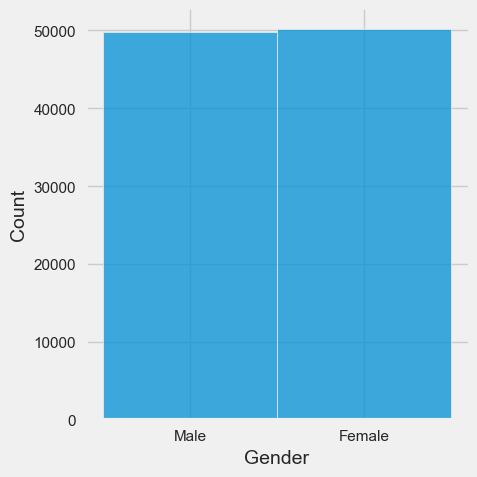

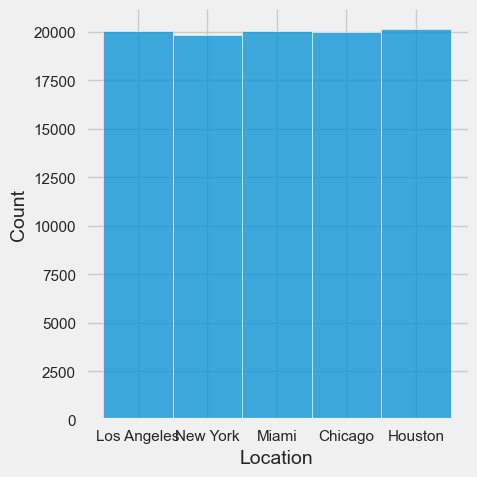

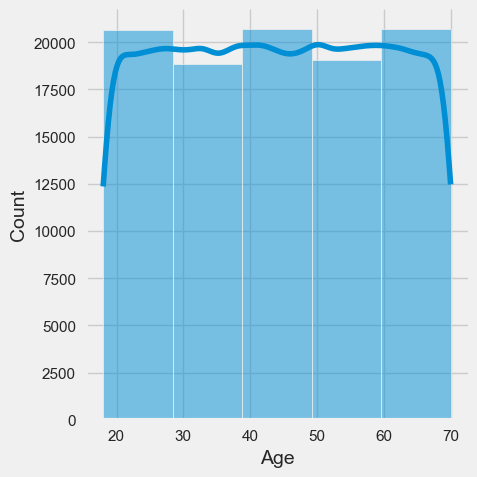

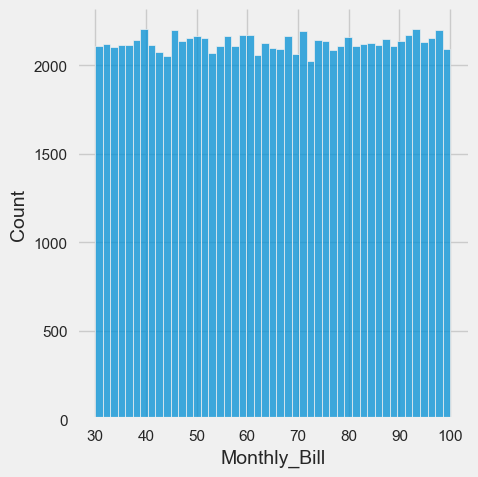

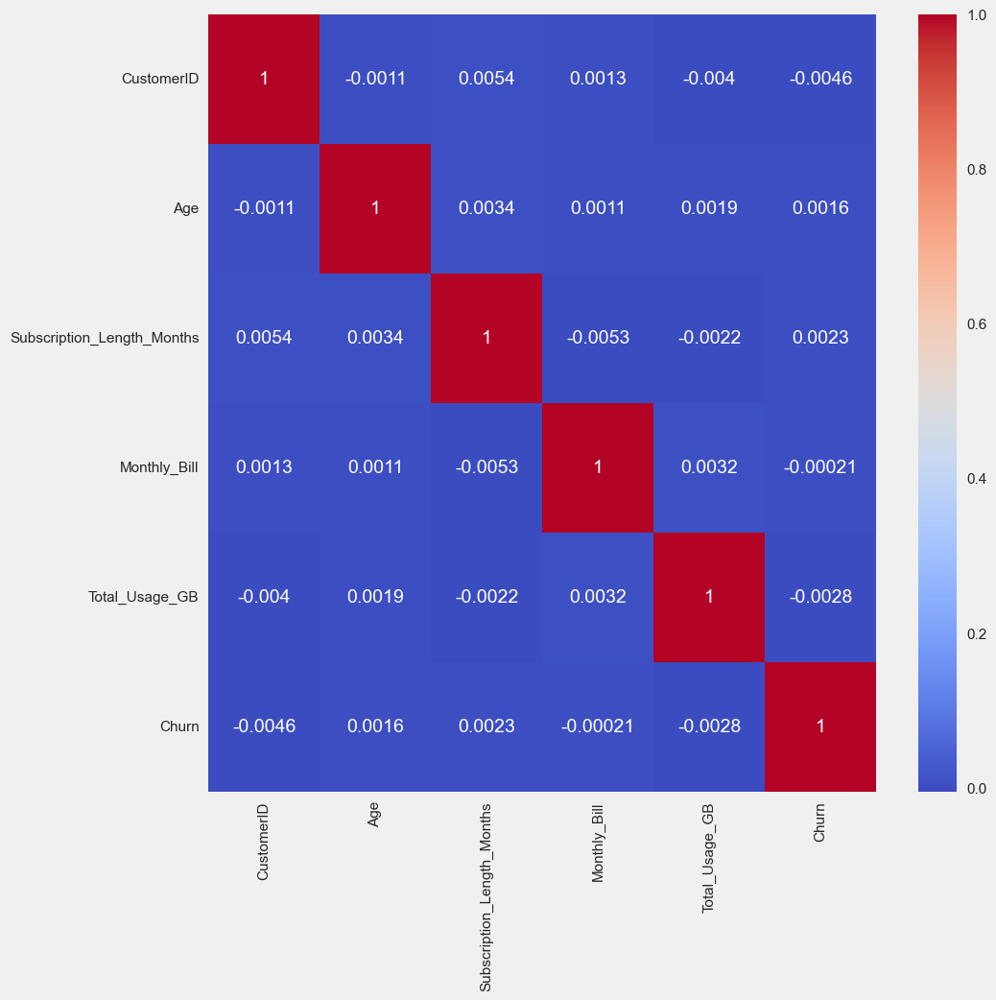

In [27]:
data['Gender'].value_counts()

#Graphical Visualization

sns.displot(data['Gender'])


data['Location'].value_counts()

sns.displot(data['Location'])

sns.displot(data['Age'],kde=True, bins=5)

sns.displot(data['Monthly_Bill'])

plt.figure(figsize=(10,10))

#Correlation Check
sns.heatmap(data.corr(), annot=True, cmap='coolwarm')

# Data Preprocessing

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 14 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   CustomerID                  100000 non-null  int64  
 1   Name                        100000 non-null  object 
 2   Age                         100000 non-null  int64  
 3   Subscription_Length_Months  100000 non-null  int64  
 4   Monthly_Bill                100000 non-null  float64
 5   Total_Usage_GB              100000 non-null  int64  
 6   Churn                       100000 non-null  int64  
 7   Gender_Female               100000 non-null  uint8  
 8   Gender_Male                 100000 non-null  uint8  
 9   Location_Chicago            100000 non-null  uint8  
 10  Location_Houston            100000 non-null  uint8  
 11  Location_Los Angeles        100000 non-null  uint8  
 12  Location_Miami              100000 non-null  uint8  
 13  Location_New Yo

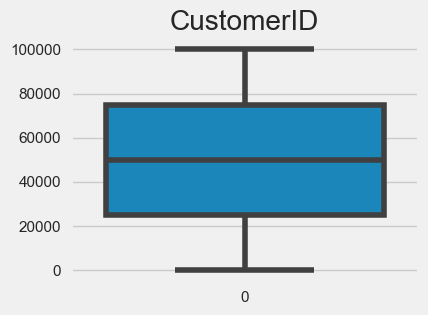

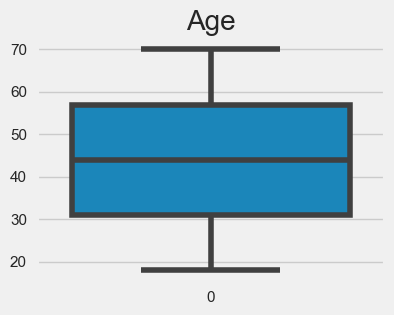

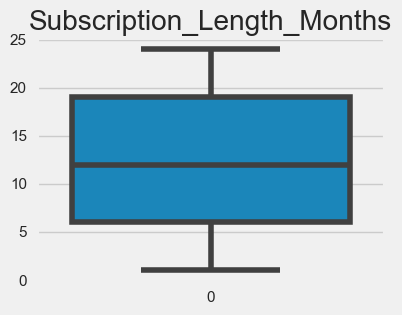

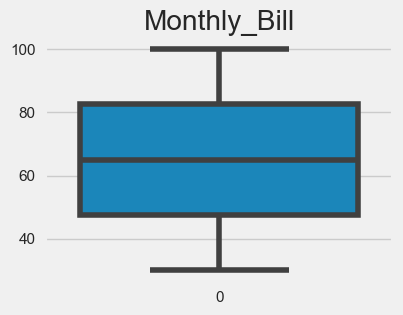

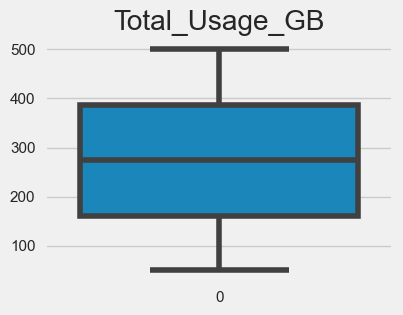

...

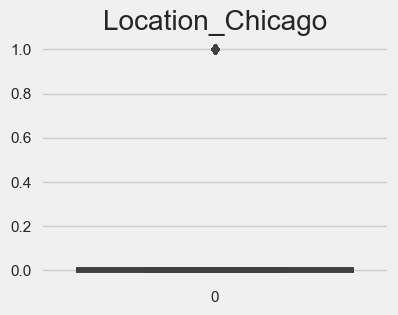

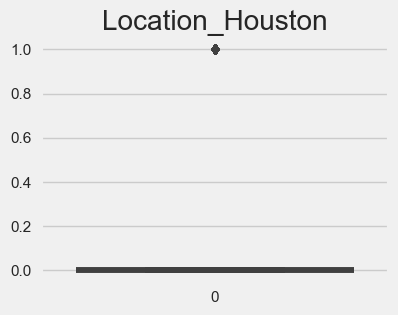

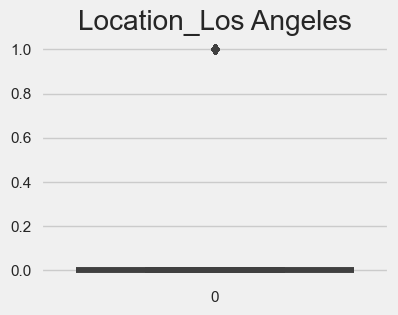

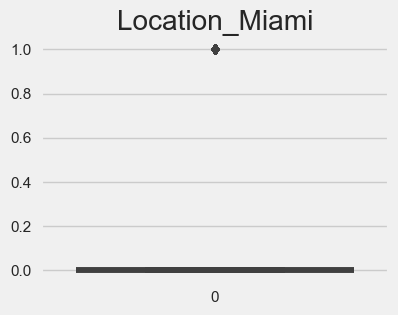

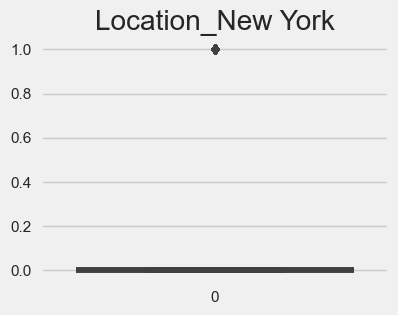

In [28]:


#Converting Categorical Features to Numerical Variable by using dummies function.

new_data = data.copy()

new_data= pd.get_dummies(columns= ['Gender', 'Location'], data=new_data)

new_data.info()

new_data.columns

independent_columns= ['CustomerID', 'Age', 'Subscription_Length_Months',
       'Monthly_Bill', 'Total_Usage_GB', 'Gender_Female',
       'Gender_Male', 'Location_Chicago', 'Location_Houston',
       'Location_Los Angeles', 'Location_Miami', 'Location_New York']

# **Outlier Check**

for i in independent_columns:
  plt.figure(figsize=(4,3))
  sns.boxplot(new_data[i])
  plt.title(i)
  plt.show()


In [29]:
# **Creating Input and Target Variables**

X= new_data[independent_columns]

Y= new_data['Churn']

## **Transforming the Data**

#Using MinMax Scaler
scaler=MinMaxScaler()

X_scaled= scaler.fit_transform(X)

# **Train Test Splitting**

X_train,X_test,Y_train,Y_test =train_test_split(X_scaled,Y, test_size=0.25, random_state=42)

X_train.shape ,X_test.shape, Y_train.shape ,Y_test.shape


((75000, 12), (25000, 12), (75000,), (25000,))

# Modeling, Tuning and Evaluation

In [34]:
#Model1

Model1= LogisticRegression()

#Mentioning Logistic Regression parameters for Tuning

parameters= ({'penalty':['l1','l2','elasticnet','none'], 'C':list(np.linspace(0,1,10)), 'max_iter': list(range(40,300,50)) })

Model1_Random= RandomizedSearchCV(Model1, parameters,n_jobs=1,scoring='precision',verbose=3)

Model1_Random.fit(X_train,Y_train)

Model1_Random.best_params_





Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END C=0.4444444444444444, max_iter=190, penalty=l2;, score=0.502 total time=   0.0s
[CV 2/5] END C=0.4444444444444444, max_iter=190, penalty=l2;, score=0.499 total time=   0.0s
[CV 3/5] END C=0.4444444444444444, max_iter=190, penalty=l2;, score=0.501 total time=   0.0s
[CV 4/5] END C=0.4444444444444444, max_iter=190, penalty=l2;, score=0.500 total time=   0.0s
[CV 5/5] END C=0.4444444444444444, max_iter=190, penalty=l2;, score=0.491 total time=   0.0s
[CV 1/5] END C=0.5555555555555556, max_iter=290, penalty=l1;, score=nan total time=   0.0s
[CV 2/5] END C=0.5555555555555556, max_iter=290, penalty=l1;, score=nan total time=   0.0s
[CV 3/5] END C=0.5555555555555556, max_iter=290, penalty=l1;, score=nan total time=   0.0s
[CV 4/5] END C=0.5555555555555556, max_iter=290, penalty=l1;, score=nan total time=   0.0s
[CV 5/5] END C=0.5555555555555556, max_iter=290, penalty=l1;, score=nan total time=   0.0s
[CV 1/5] END C=0.44

{'penalty': 'l2', 'max_iter': 190, 'C': 0.4444444444444444}

In [35]:
Model1= LogisticRegression(penalty = 'l2', max_iter=190, C= 0.44444444444)
Model1.fit(X_train,Y_train)


# Predicting the model with Training and Testing Data

Y_train_predict=Model1.predict(X_train)

Y_test_predict=Model1.predict(X_test)

# Printing Evaluation Metrics

Train_Accuracy =accuracy_score(Y_train_predict,Y_train)
print("Train_Accuracy: ",Train_Accuracy)


Test_Accuracy =accuracy_score(Y_test_predict,Y_test)
print("Test_Accuracy: ",Test_Accuracy)

Recall_Score =recall_score(Y_test_predict,Y_test)
print("Recall_Score: ",Recall_Score)

Precision_Score =precision_score(Y_test_predict,Y_test)
print("Precision_Score: ",Precision_Score)

AUC_ROC_Score =roc_auc_score(Y_test_predict,Y_test)
print("AUC_ROC_Score: ",AUC_ROC_Score)

F1_Score =f1_score(Y_test_predict,Y_test)
print("F1_Score :",F1_Score)


Dict= {'Model': 'Logistic Regression',
       'Train_Accuracy': round(Train_Accuracy,3),
       'Test_Accuracy': round(Test_Accuracy,3),
       'Recall_Score' : round(Recall_Score,3),
       'Precision_Score':round(Precision_Score,3),
       'AUC_ROC_Score':round(AUC_ROC_Score,3),
       'F1_Score': round(F1_Score,3)}

Eval_DF=pd.DataFrame(Dict, index=[1])

Eval_DF



Train_Accuracy:  0.5046
Test_Accuracy:  0.50596
Recall_Score:  0.5039651513459176
Precision_Score:  0.36322653356947354
AUC_ROC_Score:  0.5055190622436574
F1_Score : 0.42217543859649126


,Model,Train_Accuracy,Test_Accuracy,Recall_Score,Precision_Score,AUC_ROC_Score,F1_Score
1,Logistic Regression,0.505,0.506,0.504,0.363,0.506,0.422


In [38]:
#Model 2

#Creating Model Estimator for Tuning

Model2 = SVC()

#Mentioning Logistic Regression parameters for Tuning
parameters= ({'kernel' :['linear', 'poly', 'rbf', 'sigmoid'],  'C':list(np.linspace(0,1,10)), 'max_iter': list(range(40,50,100)) })

Model2_Random= RandomizedSearchCV(Model2, parameters)

Model2_Random.fit(X_train,Y_train)

Model2_Random.best_params_


{'max_iter': 40, 'kernel': 'linear', 'C': 0.1111111111111111}

In [39]:
Model2= SVC(max_iter= 40, kernel = 'linear', C = 0.1111111111111111)

Model2.fit(X_train,Y_train)

# Predicting the model with Training and Testing 

Y_train_predict=Model2.predict(X_train)

Y_test_predict=Model2.predict(X_test)


# Printing Evaluation Metrics

Train_Accuracy =accuracy_score(Y_train_predict,Y_train)

print("Train_Accuracy: ",Train_Accuracy)

Test_Accuracy =accuracy_score(Y_test_predict,Y_test)
print("Test_Accuracy: ",Test_Accuracy)

Recall_Score =recall_score(Y_test_predict,Y_test)
print("Recall_Score: ",Recall_Score)

Precision_Score =precision_score(Y_test_predict,Y_test)
print("Precision_Score: ",Precision_Score)

AUC_ROC_Score =roc_auc_score(Y_test_predict,Y_test)
print("AUC_ROC_Score: ",AUC_ROC_Score)

F1_Score =f1_score(Y_test_predict,Y_test)
print("F1_Score :",F1_Score)


Dict= {'Model': 'Support Vector Machines',
       'Train_Accuracy': round(Train_Accuracy,3),
       'Test_Accuracy': round(Test_Accuracy,3),
       'Recall_Score' : round(Recall_Score,3),
       'Precision_Score':round(Precision_Score,3),
       'AUC_ROC_Score':round(AUC_ROC_Score,3),
       'F1_Score': round(F1_Score,3)}

Eval_DF=Eval_DF.append(Dict,ignore_index=True )
Eval_DF

Train_Accuracy:  0.49804
Test_Accuracy:  0.49892
Recall_Score:  0.49586971914090155
Precision_Score:  0.5074062147802286
AUC_ROC_Score:  0.4989723727936586
F1_Score : 0.5015716388811522


,Model,Train_Accuracy,Test_Accuracy,Recall_Score,Precision_Score,AUC_ROC_Score,F1_Score
0,Logistic Regression,0.505,0.506,0.504,0.363,0.506,0.422
1,Support Vector Machines,0.498,0.499,0.496,0.507,0.499,0.502


In [40]:
# Model 3

#Creating Model Estimator for Tuning
Model3= RandomForestClassifier()

#Mentioning parameters for Tuning
parameters= ({'min_samples_split': [2,4],'min_samples_leaf': [2,4] })

Model3_Random= RandomizedSearchCV(Model3, parameters,n_jobs=1,scoring='precision',verbose=3)

Model3_Random.fit(X_train,Y_train)

Model3_Random.best_params_


Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5] END min_samples_leaf=2, min_samples_split=2;, score=0.497 total time=  31.2s
[CV 2/5] END min_samples_leaf=2, min_samples_split=2;, score=0.494 total time=  31.4s
[CV 3/5] END min_samples_leaf=2, min_samples_split=2;, score=0.493 total time=  29.6s
[CV 4/5] END min_samples_leaf=2, min_samples_split=2;, score=0.499 total time=  28.8s
[CV 5/5] END min_samples_leaf=2, min_samples_split=2;, score=0.493 total time=  27.9s
[CV 1/5] END min_samples_leaf=2, min_samples_split=4;, score=0.498 total time=  30.6s
[CV 2/5] END min_samples_leaf=2, min_samples_split=4;, score=0.501 total time=  30.4s
[CV 3/5] END min_samples_leaf=2, min_samples_split=4;, score=0.493 total time=  29.9s
[CV 4/5] END min_samples_leaf=2, min_samples_split=4;, score=0.496 total time=  29.2s
[CV 5/5] END min_samples_leaf=2, min_samples_split=4;, score=0.499 total time=  28.8s
[CV 1/5] END min_samples_leaf=4, min_samples_split=2;, score=0.494 total time=  

{'min_samples_split': 4, 'min_samples_leaf': 4}

In [41]:
# Implementing Optimal Parameters in Model3


Model3= RandomForestClassifier(min_samples_leaf=4,min_samples_split =4)
Model3.fit(X_train,Y_train)

# Predicting the model with Training and Testing Data
Y_train_predict=Model3.predict(X_train)
Y_test_predict=Model3.predict(X_test)

# Printing Evaluation Metrics
Train_Accuracy =accuracy_score(Y_train_predict,Y_train)
print("Train_Accuracy: ",Train_Accuracy)

Test_Accuracy =accuracy_score(Y_test_predict,Y_test)
print("Test_Accuracy: ",Test_Accuracy)

Recall_Score =recall_score(Y_test_predict,Y_test)
print("Recall_Score: ",Recall_Score)

Precision_Score =precision_score(Y_test_predict,Y_test)
print("Precision_Score: ",Precision_Score)

AUC_ROC_Score =roc_auc_score(Y_test_predict,Y_test)
print("AUC_ROC_Score: ",AUC_ROC_Score)

F1_Score =f1_score(Y_test_predict,Y_test)
print("F1_Score :",F1_Score)


Dict= {'Model': 'Random Forest',
       'Train_Accuracy': round(Train_Accuracy,3),
       'Test_Accuracy': round(Test_Accuracy,3),
       'Recall_Score' : round(Recall_Score,3),
       'Precision_Score':round(Precision_Score,3),
       'AUC_ROC_Score':round(AUC_ROC_Score,3),
       'F1_Score': round(F1_Score,3)}

Eval_DF=Eval_DF.append(Dict,ignore_index=True )
Eval_DF

Train_Accuracy:  0.9907333333333334
Test_Accuracy:  0.4964
Recall_Score:  0.49311701081612586
Precision_Score:  0.48446304942843343
AUC_ROC_Score:  0.4963240571429801
F1_Score : 0.4887517258182409


,Model,Train_Accuracy,Test_Accuracy,Recall_Score,Precision_Score,AUC_ROC_Score,F1_Score
0,Logistic Regression,0.505,0.506,0.504,0.363,0.506,0.422
1,Support Vector Machines,0.498,0.499,0.496,0.507,0.499,0.502
2,Random Forest,0.991,0.496,0.493,0.484,0.496,0.489


In [43]:
# **Model 4**

#Creating Model Estimator for Tuning
Model4= xgb.XGBClassifier()

#Mentioning parameters for Tuning
parameters= ({'learning_rate': list(np.linspace(0,1,5)), 'max_depth':[2,5] })

Model4_Random= RandomizedSearchCV(Model4, parameters,n_jobs=1,scoring='precision',verbose=3)

Model4_Random.fit(X_train,Y_train)

Model4_Random.best_params_


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END ....learning_rate=0.0, max_depth=2;, score=0.000 total time=   1.7s
[CV 2/5] END ....learning_rate=0.0, max_depth=2;, score=0.000 total time=   1.5s
[CV 3/5] END ....learning_rate=0.0, max_depth=2;, score=0.000 total time=   1.3s
[CV 4/5] END ....learning_rate=0.0, max_depth=2;, score=0.000 total time=   1.4s
[CV 5/5] END ....learning_rate=0.0, max_depth=2;, score=0.000 total time=   1.4s
[CV 1/5] END ....learning_rate=0.0, max_depth=5;, score=0.000 total time=   3.4s
[CV 2/5] END ....learning_rate=0.0, max_depth=5;, score=0.000 total time=   3.5s
[CV 3/5] END ....learning_rate=0.0, max_depth=5;, score=0.000 total time=   3.4s
[CV 4/5] END ....learning_rate=0.0, max_depth=5;, score=0.000 total time=   3.4s
[CV 5/5] END ....learning_rate=0.0, max_depth=5;, score=0.000 total time=   3.7s
[CV 1/5] END ...learning_rate=0.25, max_depth=2;, score=0.498 total time=   1.5s
[CV 2/5] END ...learning_rate=0.25, max_depth=2;

{'max_depth': 2, 'learning_rate': 0.75}

In [44]:
# Implementing Optimal Parameters in Model4


Model4= xgb.XGBClassifier(learning_rate =0.75, max_depth= 2)
Model4.fit(X_train,Y_train)

# Predicting the model with Training and Testing Data
Y_train_predict=Model4.predict(X_train)
Y_test_predict=Model4.predict(X_test)

# Printing Evaluation Metrics
Train_Accuracy =accuracy_score(Y_train_predict,Y_train)
print("Train_Accuracy: ",Train_Accuracy)

Test_Accuracy =accuracy_score(Y_test_predict,Y_test)
print("Test_Accuracy: ",Test_Accuracy)

Recall_Score =recall_score(Y_test_predict,Y_test)
print("Recall_Score: ",Recall_Score)

Precision_Score =precision_score(Y_test_predict,Y_test)
print("Precision_Score: ",Precision_Score)

AUC_ROC_Score =roc_auc_score(Y_test_predict,Y_test)
print("AUC_ROC_Score: ",AUC_ROC_Score)

F1_Score =f1_score(Y_test_predict,Y_test)
print("F1_Score :",F1_Score)


Dict= {'Model': 'XG Boost',
       'Train_Accuracy': round(Train_Accuracy,3),
       'Test_Accuracy': round(Test_Accuracy,3),
       'Recall_Score' : round(Recall_Score,3),
       'Precision_Score':round(Precision_Score,3),
       'AUC_ROC_Score':round(AUC_ROC_Score,3),
       'F1_Score': round(F1_Score,3)}

Eval_DF=Eval_DF.append(Dict,ignore_index=True )
Eval_DF


Train_Accuracy:  0.5429733333333333
Test_Accuracy:  0.49864
Recall_Score:  0.4951598962834918
Precision_Score:  0.46119787473836743
AUC_ROC_Score:  0.49839900994368186
F1_Score : 0.4775758586195399


,Model,Train_Accuracy,Test_Accuracy,Recall_Score,Precision_Score,AUC_ROC_Score,F1_Score
0,Logistic Regression,0.505,0.506,0.504,0.363,0.506,0.422
1,Support Vector Machines,0.498,0.499,0.496,0.507,0.499,0.502
2,Random Forest,0.991,0.496,0.493,0.484,0.496,0.489
3,XG Boost,0.543,0.499,0.495,0.461,0.498,0.478


In [45]:
# **Model 5**

#Creating Model Estimator for Tuning
Model5= AdaBoostClassifier()

#Mentioning parameters for Tuning
parameters= ({'learning_rate': list(np.linspace(0,1,5)), 'n_estimators':[20,50,100]})

Model5_Random= RandomizedSearchCV(Model5, parameters,n_jobs=1,scoring='precision',verbose=3)

Model5_Random.fit(X_train,Y_train)

Model5_Random.best_params_




Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END learning_rate=0.5, n_estimators=100;, score=0.500 total time=  12.9s
[CV 2/5] END learning_rate=0.5, n_estimators=100;, score=0.492 total time=  12.8s
[CV 3/5] END learning_rate=0.5, n_estimators=100;, score=0.493 total time=  12.4s
[CV 4/5] END learning_rate=0.5, n_estimators=100;, score=0.503 total time=  12.6s
[CV 5/5] END learning_rate=0.5, n_estimators=100;, score=0.499 total time=  13.3s
[CV 1/5] END learning_rate=0.75, n_estimators=100;, score=0.503 total time=  13.5s
[CV 2/5] END learning_rate=0.75, n_estimators=100;, score=0.491 total time=  12.8s
[CV 3/5] END learning_rate=0.75, n_estimators=100;, score=0.490 total time=  13.2s
[CV 4/5] END learning_rate=0.75, n_estimators=100;, score=0.502 total time=  13.3s
[CV 5/5] END learning_rate=0.75, n_estimators=100;, score=0.501 total time=  13.0s
[CV 1/5] END learning_rate=0.25, n_estimators=100;, score=0.501 total time=  12.7s
[CV 2/5] END learning_rate=0.25

{'n_estimators': 20, 'learning_rate': 0.25}

In [46]:
# Implementing Optimal Parameters in Model5

Model5 = AdaBoostClassifier(learning_rate =0.25, n_estimators =20)
Model5.fit(X_train,Y_train)

# Predicting the model with Training and Testing Data
Y_train_predict=Model5.predict(X_train)
Y_test_predict=Model5.predict(X_test)

# Printing Evaluation Metrics
Train_Accuracy =accuracy_score(Y_train_predict,Y_train)
print("Train_Accuracy: ",Train_Accuracy)

Test_Accuracy =accuracy_score(Y_test_predict,Y_test)
print("Test_Accuracy: ",Test_Accuracy)

Recall_Score =recall_score(Y_test_predict,Y_test)
print("Recall_Score: ",Recall_Score)

Precision_Score =precision_score(Y_test_predict,Y_test)
print("Precision_Score: ",Precision_Score)

AUC_ROC_Score =roc_auc_score(Y_test_predict,Y_test)
print("AUC_ROC_Score: ",AUC_ROC_Score)

F1_Score =f1_score(Y_test_predict,Y_test)
print("F1_Score :",F1_Score)


Dict= {'Model': 'Ada Boost',
       'Train_Accuracy': round(Train_Accuracy,3),
       'Test_Accuracy': round(Test_Accuracy,3),
       'Recall_Score' : round(Recall_Score,3),
       'Precision_Score':round(Precision_Score,3),
       'AUC_ROC_Score':round(AUC_ROC_Score,3),
       'F1_Score': round(F1_Score,3)}

Eval_DF=Eval_DF.append(Dict,ignore_index=True )
Eval_DF


Train_Accuracy:  0.5095733333333333
Test_Accuracy:  0.50344
Recall_Score:  0.5005467468562056
Precision_Score:  0.2947995491869264
AUC_ROC_Score:  0.5025918534100073
F1_Score : 0.3710608977606647


,Model,Train_Accuracy,Test_Accuracy,Recall_Score,Precision_Score,AUC_ROC_Score,F1_Score
0,Logistic Regression,0.505,0.506,0.504,0.363,0.506,0.422
1,Support Vector Machines,0.498,0.499,0.496,0.507,0.499,0.502
2,Random Forest,0.991,0.496,0.493,0.484,0.496,0.489
3,XG Boost,0.543,0.499,0.495,0.461,0.498,0.478
4,Ada Boost,0.510,0.503,0.501,0.295,0.503,0.371


In [47]:
# **Model 6**

Model6 = GaussianNB()
Model6.fit(X_train,Y_train)

# Predicting the model with Training and Testing Data
Y_train_predict=Model6.predict(X_train)
Y_test_predict=Model6.predict(X_test)

# Printing Evaluation Metrics
Train_Accuracy =accuracy_score(Y_train_predict,Y_train)
print("Train_Accuracy: ",Train_Accuracy)

Test_Accuracy =accuracy_score(Y_test_predict,Y_test)
print("Test_Accuracy: ",Test_Accuracy)

Recall_Score =recall_score(Y_test_predict,Y_test)
print("Recall_Score: ",Recall_Score)

Precision_Score =precision_score(Y_test_predict,Y_test)
print("Precision_Score: ",Precision_Score)

AUC_ROC_Score =roc_auc_score(Y_test_predict,Y_test)
print("AUC_ROC_Score: ",AUC_ROC_Score)

F1_Score =f1_score(Y_test_predict,Y_test)
print("F1_Score :",F1_Score)


Dict= {'Model': 'Gaussian NB',
       'Train_Accuracy': round(Train_Accuracy,3),
       'Test_Accuracy': round(Test_Accuracy,3),
       'Recall_Score' : round(Recall_Score,3),
       'Precision_Score':round(Precision_Score,3),
       'AUC_ROC_Score':round(AUC_ROC_Score,3),
       'F1_Score': round(F1_Score,3)}

Eval_DF=Eval_DF.append(Dict,ignore_index=True )
Eval_DF


Train_Accuracy:  0.50464
Test_Accuracy:  0.50604
Recall_Score:  0.5036917163952666
Precision_Score:  0.40090162614715824
AUC_ROC_Score:  0.5056339876226317
F1_Score : 0.446456587027657


,Model,Train_Accuracy,Test_Accuracy,Recall_Score,Precision_Score,AUC_ROC_Score,F1_Score
0,Logistic Regression,0.505,0.506,0.504,0.363,0.506,0.422
1,Support Vector Machines,0.498,0.499,0.496,0.507,0.499,0.502
2,Random Forest,0.991,0.496,0.493,0.484,0.496,0.489
3,XG Boost,0.543,0.499,0.495,0.461,0.498,0.478
4,Ada Boost,0.510,0.503,0.501,0.295,0.503,0.371
5,Gaussian NB,0.505,0.506,0.504,0.401,0.506,0.446


In [48]:

#**Metrics Explanation**

Eval_DF


,Model,Train_Accuracy,Test_Accuracy,Recall_Score,Precision_Score,AUC_ROC_Score,F1_Score
0,Logistic Regression,0.505,0.506,0.504,0.363,0.506,0.422
1,Support Vector Machines,0.498,0.499,0.496,0.507,0.499,0.502
2,Random Forest,0.991,0.496,0.493,0.484,0.496,0.489
3,XG Boost,0.543,0.499,0.495,0.461,0.498,0.478
4,Ada Boost,0.510,0.503,0.501,0.295,0.503,0.371
5,Gaussian NB,0.505,0.506,0.504,0.401,0.506,0.446


# Model and Deployment using Pycaret

In [49]:
## **Modeling Using PyCaret**

In [50]:
import pycaret

In [51]:
import pandas as pd

In [52]:
file = 'customer_churn_large_dataset.xlsx'
data = pd.read_excel(file)

In [53]:
from pycaret.classification import *

In [54]:
exp = setup(data = data, target = 'Churn', session_id = 123)
eda()

,Description,Value
0,Session id,123
1,Target,Churn
2,Target type,Binary
3,Original data shape,"(100000, 9)"
4,Transformed data shape,"(100000, 13)"
5,Transformed train set shape,"(70000, 13)"
6,Transformed test set shape,"(30000, 13)"
7,Ordinal features,1
8,Numeric features,5
9,Categorical features,3


Shape of your Data Set loaded: (100000, 13)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    12 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Binary_Classification problem #####################


Row
    [0] WidgetBox
        [0] Select(name='y', options=['CustomerID', ...], value='CustomerID')
    [1] ParamFunction(function, _pane=HoloViews)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['CustomerID', ...], value='CustomerID')
        [1] Select(name='Y-Axis', options=['CustomerID', ...], value='Age')
        [2] Select(name='Color', options=['None', 'Churn'], value='None')
    [1] ParamFunction(function, _pane=HoloViews)

Column
    [0] Row
        [0] HoloViews(DynamicMap, height=400, sizing_mode='fixed', width=600)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['Gender', 'Location_Chica...], value='Gender', width=250)
            [1] VSpacer()

Column
    [0] Row
        [0] HoloViews(DynamicMap, height=400, sizing_mode='fixed', width=600)
        [1] Column
            [0] WidgetBox
                [0] Select(margin=(20, 20, 20, 20), options=['Total_Usage_GB', ...], value='Total_Usage_GB', width=250)
            [1] VSpacer()

HoloViews(DynamicMap)

HoloViews(Layout)

No date vars could be found in data set


HoloViews(Overlay, height=500, sizing_mode='fixed', width=600)

Row
    [0] WidgetBox
        [0] Select(name='X-Axis', options=['Gender', 'Location_Chica...], value='Gender')
        [1] Select(name='Y-Axis', options=['CustomerID', ...], value='CustomerID')
    [1] ParamFunction(function, _pane=HoloViews)

Time to run AutoViz (in seconds) = 10


In [55]:
best = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
nb,Naive Bayes,0.5043,0.5047,0.3632,0.5030,0.4217,0.0073,0.0077,1.0080
lr,Logistic Regression,0.5022,0.5047,0.0000,0.0000,0.0000,-0.0000,-0.0012,3.3560
dt,Decision Tree Classifier,0.5022,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.8850
ridge,Ridge Classifier,0.5022,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.7980
rf,Random Forest Classifier,0.5022,0.4992,0.0000,0.0000,0.0000,0.0000,0.0000,1.1290
qda,Quadratic Discriminant Analysis,0.5022,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.8830
ada,Ada Boost Classifier,0.5022,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.9370
gbc,Gradient Boosting Classifier,0.5022,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.9210
lda,Linear Discriminant Analysis,0.5022,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,0.9240
xgboost,Extreme Gradient Boosting,0.5022,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0280


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [56]:
print(best)

GaussianNB(priors=None, var_smoothing=1e-09)


In [58]:
evaluate_model(best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

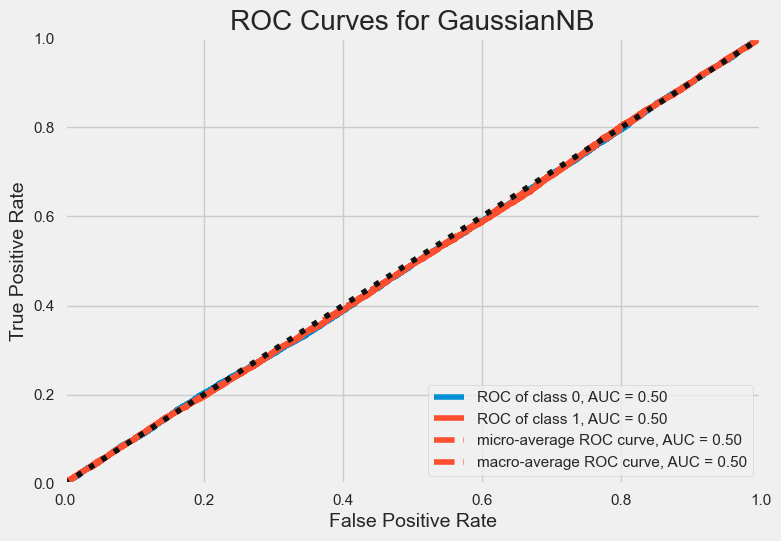

In [59]:
plot_model(best, plot = 'auc')

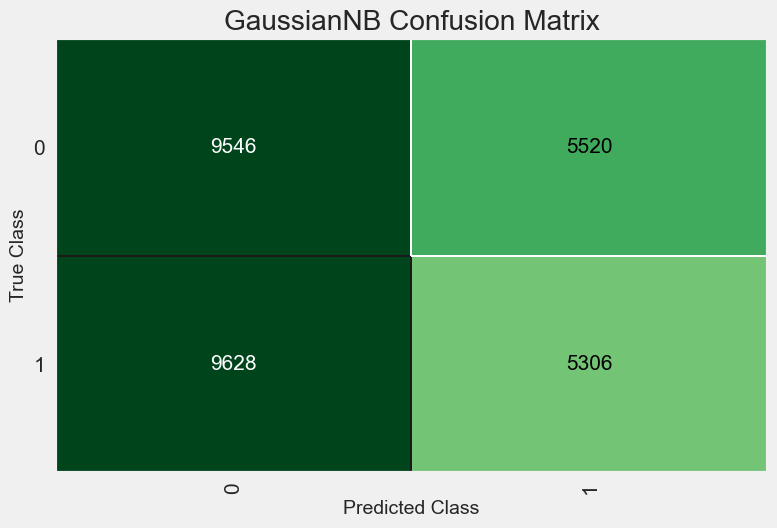

In [60]:
plot_model(best, plot = 'confusion_matrix')

In [61]:
predict_model(best)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Naive Bayes,0.4951,0.4955,0.3553,0.4901,0.4120,-0.0111,-0.0115


,CustomerID,Name,Age,Gender,Location,Subscription_Length_Months,Monthly_Bill,Total_Usage_GB,Churn,prediction_label,prediction_score
13053,13054,Customer_13054,49,Female,Houston,22,67.779999,354,0,1,0.5022
82730,82731,Customer_82731,32,Male,New York,2,46.750000,118,0,0,0.5091
60497,60498,Customer_60498,41,Female,Chicago,17,54.189999,166,0,0,0.5012
50770,50771,Customer_50771,44,Female,Miami,7,86.910004,53,1,1,0.5025
54676,54677,Customer_54677,43,Female,New York,12,48.540001,416,0,0,0.5062
...,...,...,...,...,...,...,...,...,...,...,...
41039,41040,Customer_41040,36,Male,Houston,2,81.320000,303,1,0,0.5065
84166,84167,Customer_84167,23,Female,Chicago,24,97.269997,482,0,0,0.5005
57803,57804,Customer_57804,63,Male,Chicago,2,87.339996,71,0,0,0.5009
31859,31860,Customer_31860,19,Male,Chicago,5,34.259998,341,0,0,0.5025


In [62]:
save_model(best, 'my_best_pipeline')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=FastMemory(location=C:\Users\tsaih\AppData\Local\Temp\joblib),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['CustomerID', 'Age',
                                              'Subscription_Length_Months',
                                              'Monthly_Bill', 'Total_Usage_GB'],
                                     transformer=SimpleImputer(add_indicator=False,
                                                               copy=True,
                                                               fill_value=None,
                                                               keep_empty_features=False,
                                                               missing_values=nan,
                                                               strat...
                                                               use_cat_names=True,
                                        

In [63]:
create_app(best)

Running on local URL:  http://127.0.0.1:7861

To create a public link, set `share=True` in `launch()`.


# Conclusion

1. In Entire Dataset, there is no missing, duplicates and outlier items.
2. And also found there is no correlation among features, MinMax Scaler is used for Input Data Transformation.
3. Among All 6 Models in Individual Modeling, Almost All Models are giving test accuracy about 50%. It means, there is a need of more relavant features and data to capture the patterns from the data.
4. In Addition to this, Also tried with Pycaret Library. And Finally, Navie Bayes Model works some what well.
5. Eventhough, it is not that much accurate, went for automated deployment phase. 
6. Model can be developed more, if more features and details are available.


                                                # Thankyou Very Much #